# SETUP

## Check environment

In [ ]:
USE_GPU = True

In [ ]:
try:
    import google.colab
    COLAB = True
except:
    COLAB = False
print(f"Using Google Colab: {COLAB}")

In [ ]:
!pip install --upgrade pip tensorflow keras jupyterlab-vim jupyterlab-indent-guides maap-user-workspace-management-jupyter-extension pydot
!apt-get install graphviz -y

## Libraries

In [ ]:
# System
import os
import glob
import shutil
import copy
import re
from datetime import datetime
import logging
import sys

# Data
import numpy as np
import pandas as pd

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

# Data processing
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import seaborn as sns
%matplotlib inline

# Model
import tensorflow as tf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from keras import Input, Model, Sequential
from keras.layers import Dense, LSTM, RepeatVector, TimeDistributed, Dropout, GRU, Conv1D, MaxPooling1D, Flatten
from keras.utils import plot_model
from keras.saving import load_model
from keras.callbacks import LearningRateScheduler, ModelCheckpoint
from keras.optimizers import Adam
from keras.losses import MeanAbsoluteError
from keras.losses import MeanAbsoluteError, MeanSquaredError
import keras.backend as K

# Append the custom libraries to system path
if COLAB:
    sys.path.append("/content/air_quality_index_project")

# Configure device
if not USE_GPU:
    print("Using CPU to train")
    os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
else:
    print("Using GPU to train")

# Custom libraries written by myself
from src.plot import plot_1_data, plot_2_data, plot_prediction
from src.reduction_model.lstm_s2s import LSTMSeq2SeqReduction
from src.reduction_model.gru_s2s import GRUSeq2SeqReduction
from src.reduction_model.cnnlstm_s2s import CNNLSTMSeq2SeqReduction
from src.prediction_model.lstm import LSTMPrediction
from src.loop_model import generate_loopresults, choose_the_best
from src.reduce_data_utils import prepareReducedData, augmentReducedData
from src.data_utils import mice

# Configuration reader
from src.config_reader import ConfigurationReader

# Checking Tensorflow
print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))
print(tf.config.list_physical_devices('CPU'))

## Configuration

In [ ]:
if COLAB:
    confReader = ConfigurationReader("/content/air_quality_index_project/model_params_colab.json")
else:
    confReader = ConfigurationReader("/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/model_params.json")
print(confReader)

conf = confReader.data

# CMAQ DATA

## Load cmaq data

### Raw data

In [80]:
df_cmaq_raw = []
for csv_file in glob.glob(f'{conf["dataset"]["cmaq"]["file_dir"]}/*'):
    df_current_station = pd.read_csv(csv_file).dropna(axis=1, how="all")
    station = csv_file.split("/")[-1].split(".")[0]
    print(f"{csv_file} - {len(df_current_station)} records")
    df_current_station["station"] = station
    df_cmaq_raw.append(df_current_station)
df_cmaq_raw = pd.concat(df_cmaq_raw, axis=0, ignore_index=True)
df_cmaq_raw

/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/216.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/212.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/201.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/215.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/213.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/214.csv - 7476 records
/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station/211.csv - 7476 records


,Date,Time,PM25,PM10,O3,SO2,NO2,station
0,01/01/2022,7:00:00,4.962867,17.781220,0.098060,0.000077,0.000981,216
1,01/01/2022,8:00:00,6.538577,23.655580,0.079992,0.000105,0.001294,216
2,01/01/2022,9:00:00,7.173492,25.594369,0.063973,0.000132,0.001035,216
3,01/01/2022,10:00:00,7.377719,26.746649,0.052615,0.000131,0.000818,216
4,01/01/2022,11:00:00,6.629785,23.692133,0.044166,0.000090,0.000607,216
...,...,...,...,...,...,...,...,...
52327,31/12/2022,1:00:00,12.338016,44.975750,0.027149,0.000055,0.000068,211
52328,31/12/2022,2:00:00,12.207455,43.493079,0.026779,0.000055,0.000067,211
52329,31/12/2022,3:00:00,12.345228,45.676369,0.026994,0.000056,0.000067,211
52330,31/12/2022,4:00:00,12.455814,47.065511,0.026826,0.000057,0.000067,211


### Handle metadata

In [81]:
# Merge Date and Time columns
df_cmaq_raw["time"] = df_cmaq_raw["Time"] + " " + df_cmaq_raw["Date"]
df_cmaq_raw["time"] = df_cmaq_raw["time"].apply(lambda element: datetime.strptime(element, "%H:%M:%S %d/%m/%Y"))
df_cmaq_raw = df_cmaq_raw.assign(time=pd.to_datetime(df_cmaq_raw["time"]))
df_cmaq_raw = df_cmaq_raw.assign(station=df_cmaq_raw["station"].astype("int64"))
df_cmaq_raw.drop(columns=["Date", "Time"], inplace=True)

# Rename columns
df_cmaq_raw = df_cmaq_raw.rename(columns={name: f"{name.lower()}" for name in df_cmaq_raw.columns})

# Set index
df_cmaq_raw = df_cmaq_raw.set_index("time")

# Print
df_cmaq_raw

,pm25,pm10,o3,so2,no2,station
time,,,,,,
2022-01-01 07:00:00,4.962867,17.781220,0.098060,0.000077,0.000981,216
2022-01-01 08:00:00,6.538577,23.655580,0.079992,0.000105,0.001294,216
2022-01-01 09:00:00,7.173492,25.594369,0.063973,0.000132,0.001035,216
2022-01-01 10:00:00,7.377719,26.746649,0.052615,0.000131,0.000818,216
2022-01-01 11:00:00,6.629785,23.692133,0.044166,0.000090,0.000607,216
...,...,...,...,...,...,...
2022-12-31 01:00:00,12.338016,44.975750,0.027149,0.000055,0.000068,211
2022-12-31 02:00:00,12.207455,43.493079,0.026779,0.000055,0.000067,211
2022-12-31 03:00:00,12.345228,45.676369,0.026994,0.000056,0.000067,211


## EDA

### Statistic

In [82]:
df_cmaq_stat = df_cmaq_raw.describe()
df_cmaq_stat.to_csv(f'{conf["workspace"]["data_statistic_dir"]}/df_cmaq_stat.csv')
df_cmaq_stat

,pm25,pm10,o3,so2,no2,station
count,52332.000000,52332.000000,52332.000000,5.233200e+04,52332.000000,52332.000000
mean,19.373324,55.656308,0.028526,5.530125e-04,0.005339,211.714286
std,16.917802,47.628885,0.007503,9.868932e-04,0.006821,4.651136
min,0.068628,0.089172,0.014453,3.160000e-09,0.000017,201.000000
25%,9.758437,28.219765,0.025730,1.004007e-04,0.000934,211.000000
50%,13.706406,44.558864,0.027195,2.344415e-04,0.002718,213.000000
75%,23.379823,65.914449,0.028940,5.746160e-04,0.007005,215.000000
max,294.028215,920.479352,0.119494,1.995822e-02,0.073905,216.000000


### Check null

In [83]:
df_cmaq_raw.isnull().sum()

pm25       0
pm10       0
o3         0
so2        0
no2        0
station    0
dtype: int64

### Correlation matrix

In [84]:
corr_mat = df_cmaq_raw.corr()
corr_mat

,pm25,pm10,o3,so2,no2,station
pm25,1.000000,0.944272,-0.259873,0.473326,0.602989,-0.094575
pm10,0.944272,1.000000,-0.195024,0.326449,0.372141,-0.097666
o3,-0.259873,-0.195024,1.000000,-0.232969,-0.350754,-0.003261
so2,0.473326,0.326449,-0.232969,1.000000,0.689944,0.091167
no2,0.602989,0.372141,-0.350754,0.689944,1.000000,0.112055
station,-0.094575,-0.097666,-0.003261,0.091167,0.112055,1.000000


<Axes: >

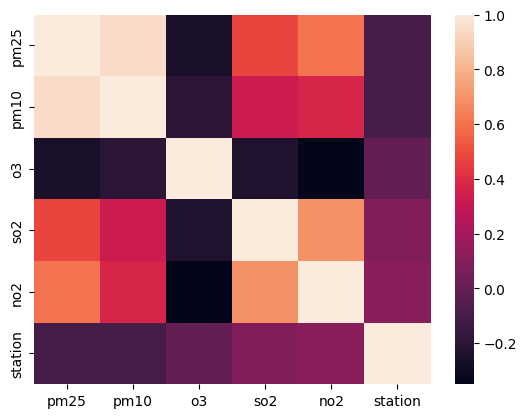

In [85]:
sns.heatmap(corr_mat)

### Statistic by station

Current station = 201, number of records = 7476



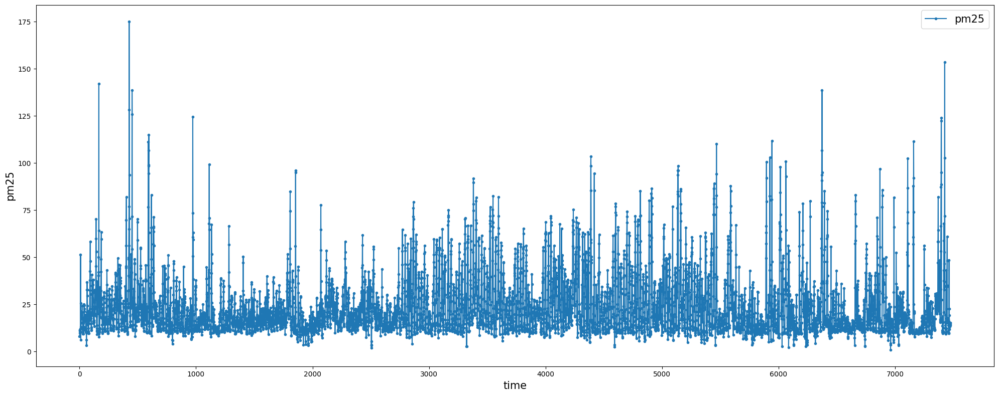

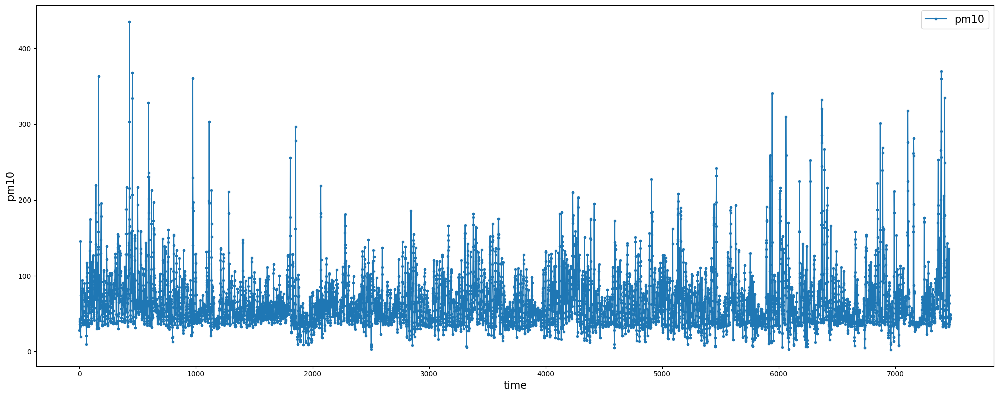

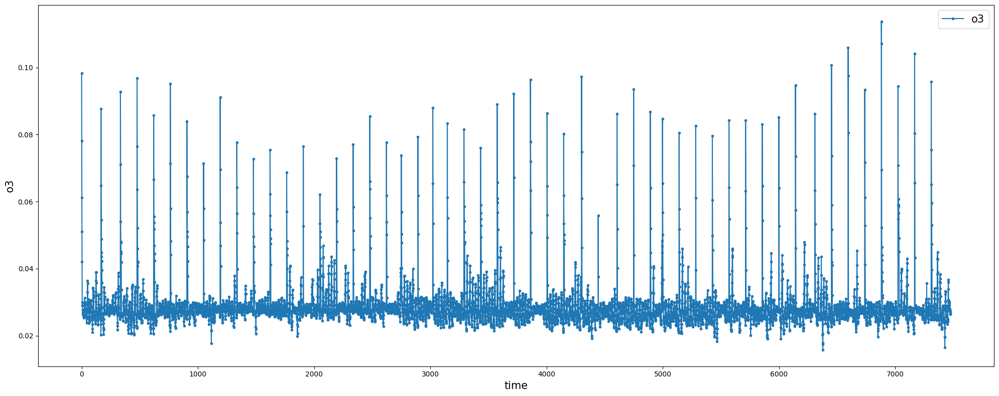

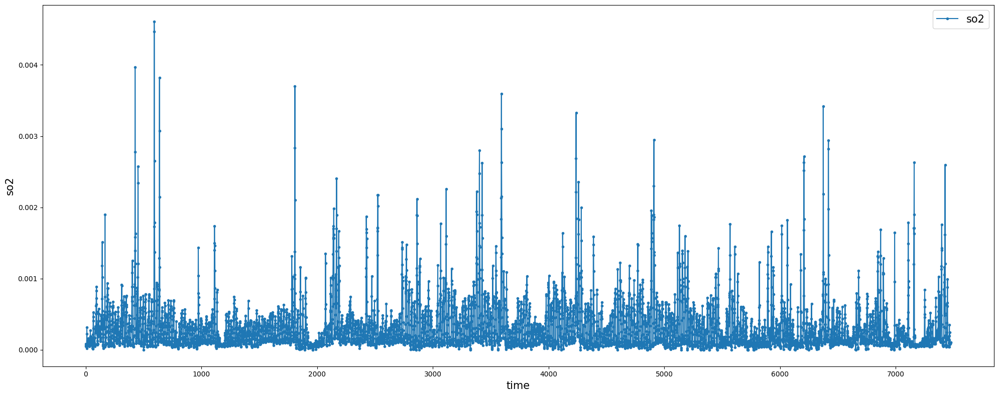

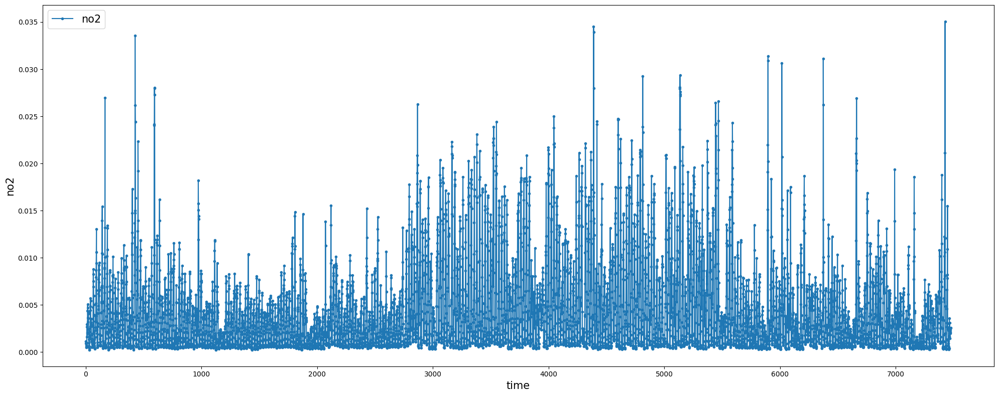



Current station = 211, number of records = 7476



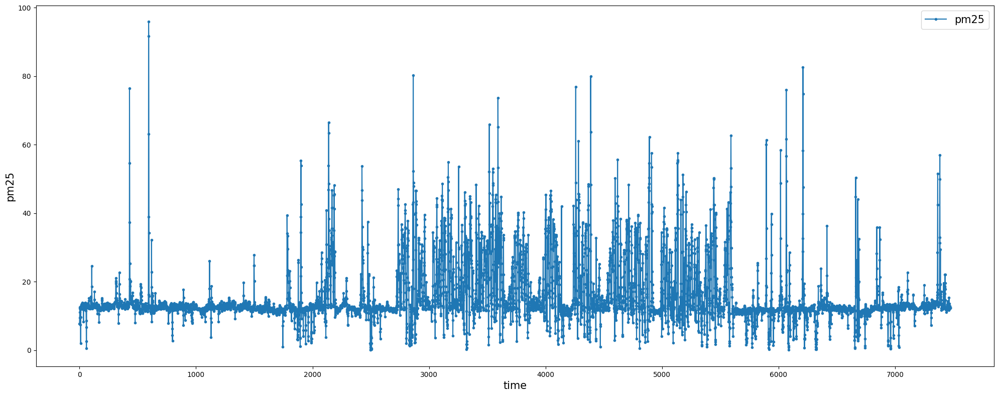

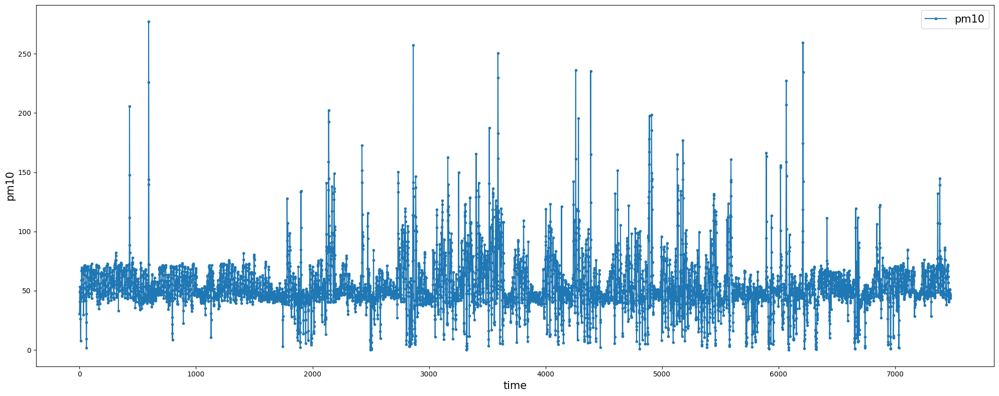

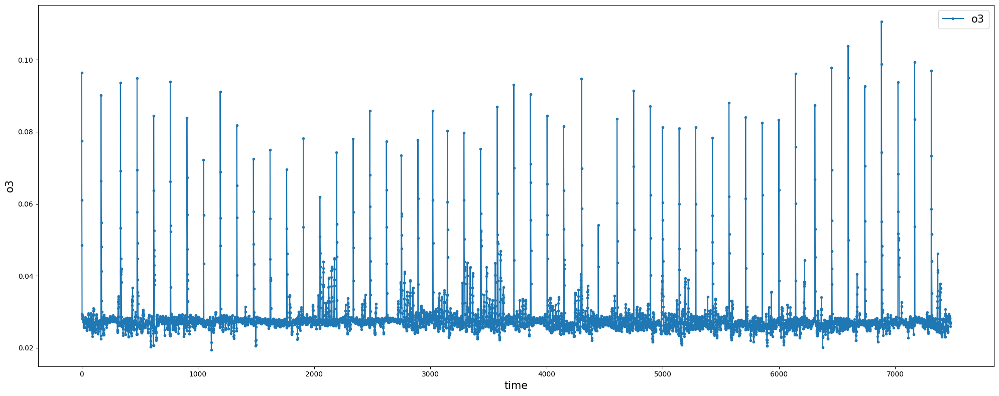

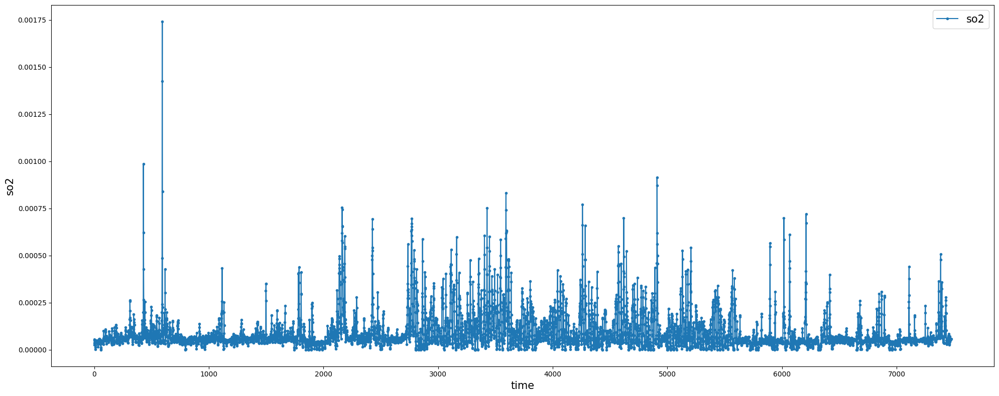

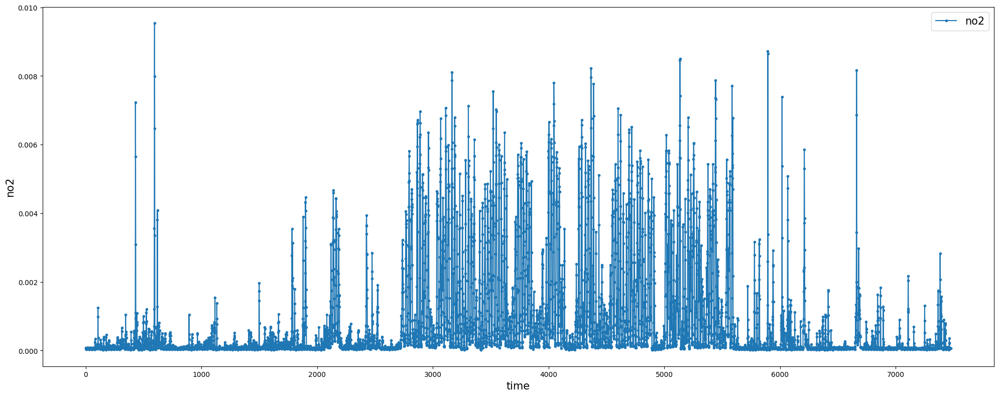



Current station = 212, number of records = 7476



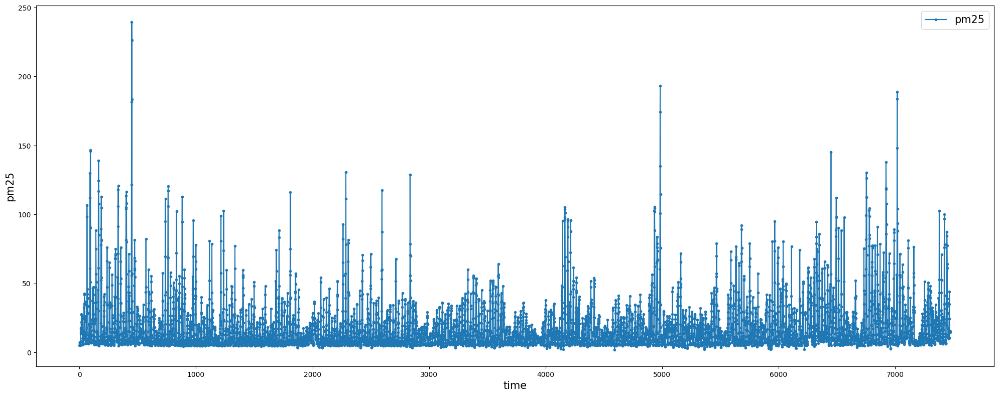

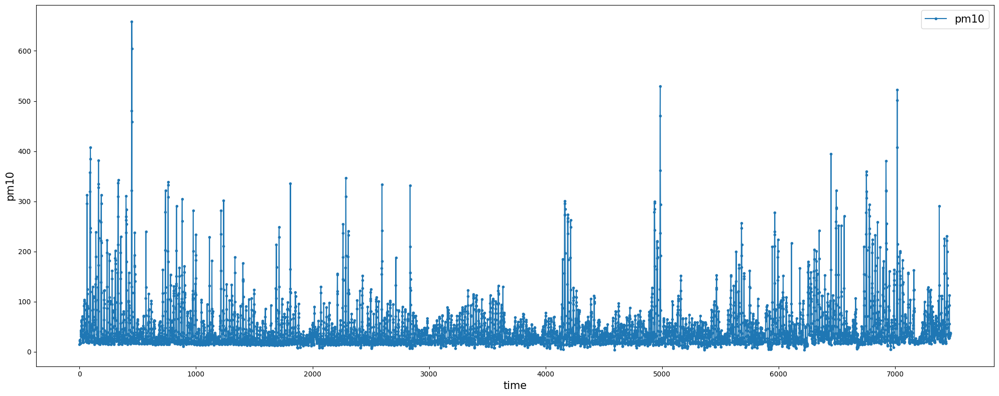

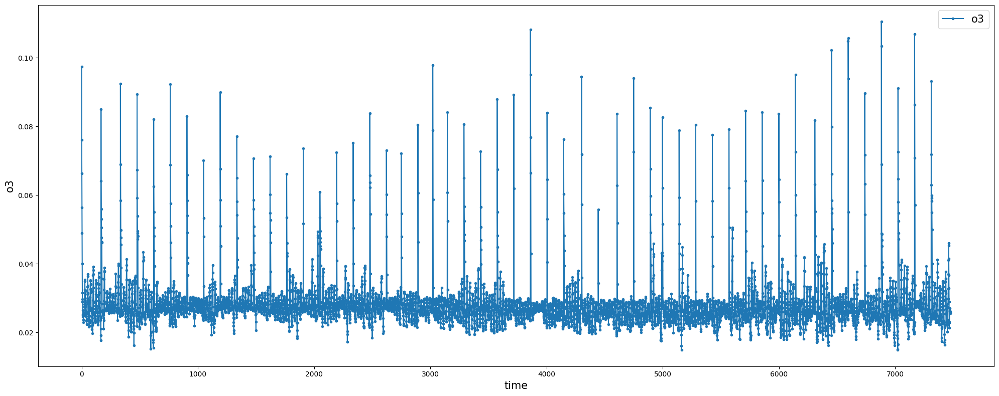

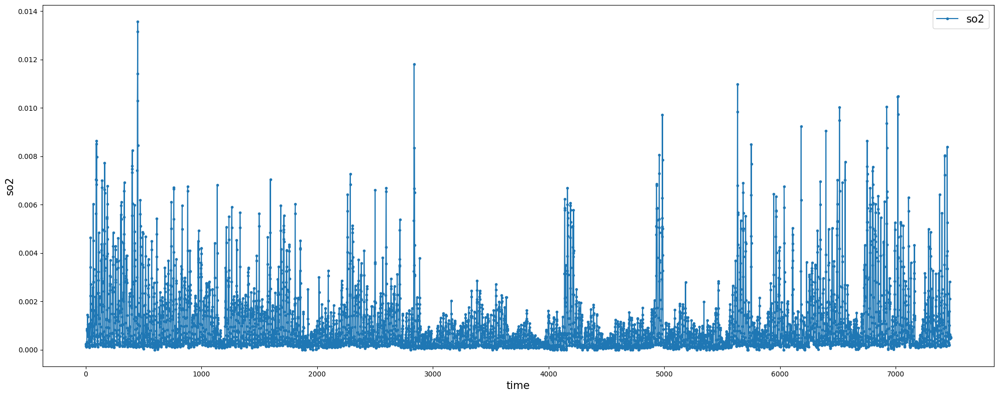

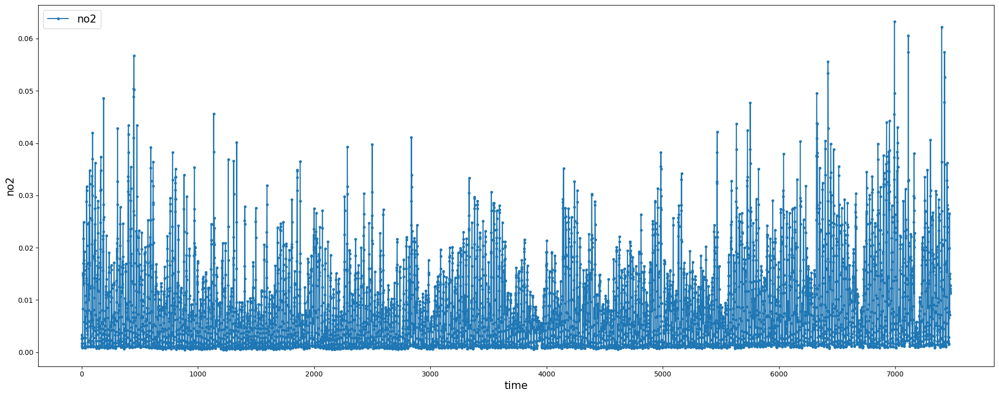



Current station = 213, number of records = 7476



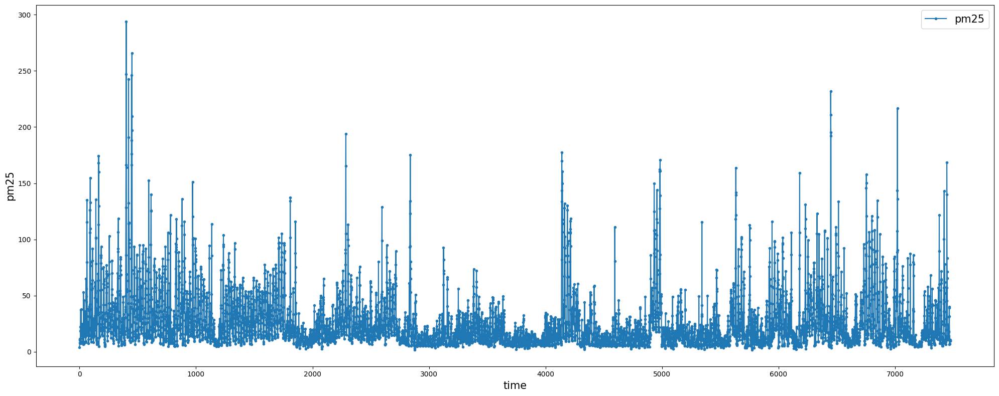

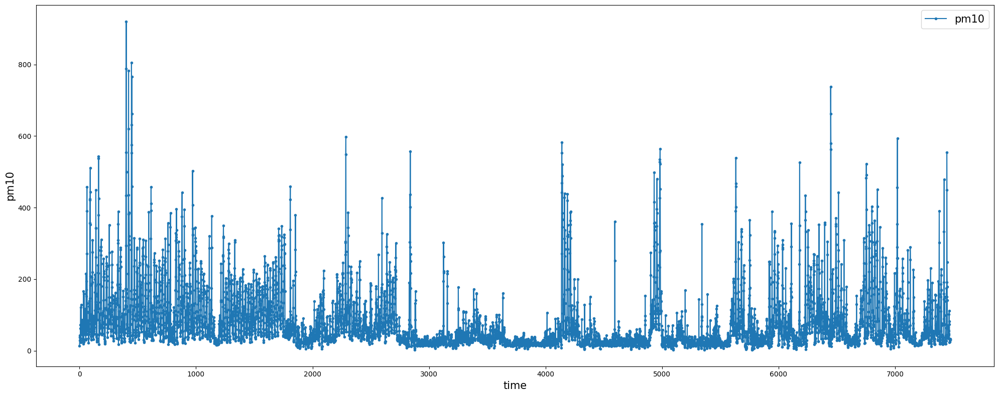

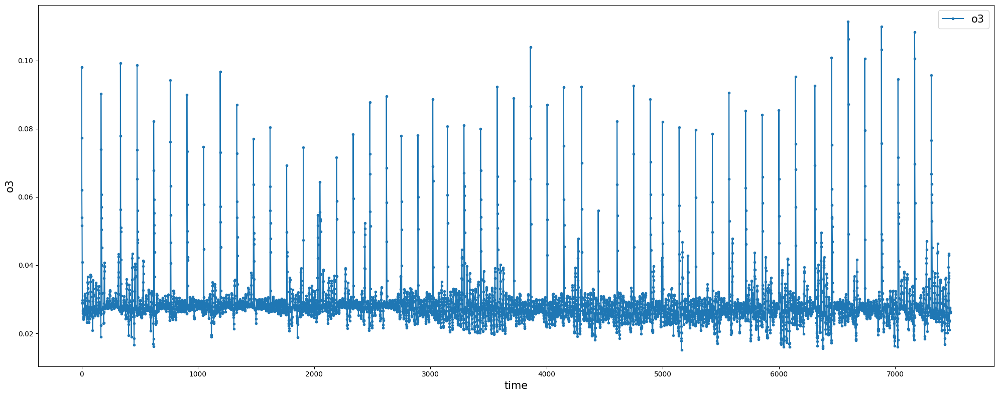

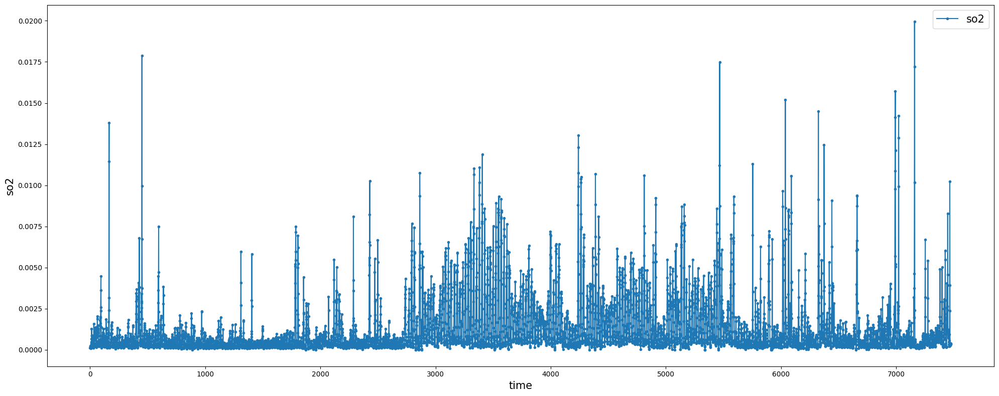

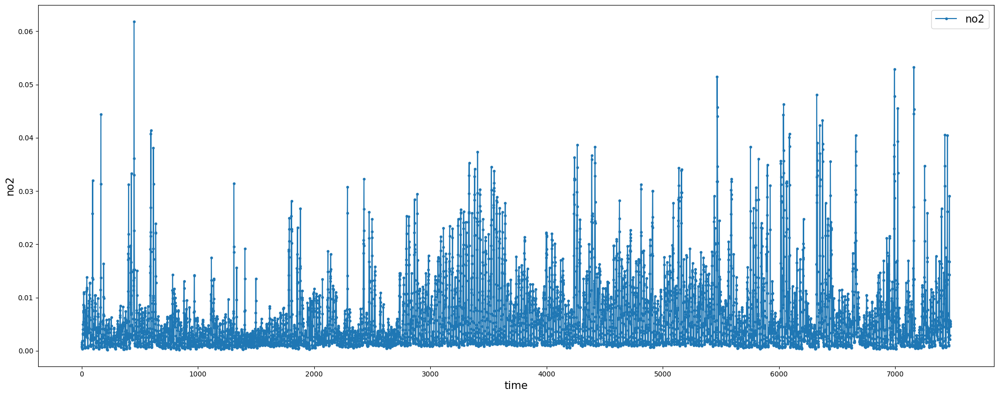



Current station = 214, number of records = 7476



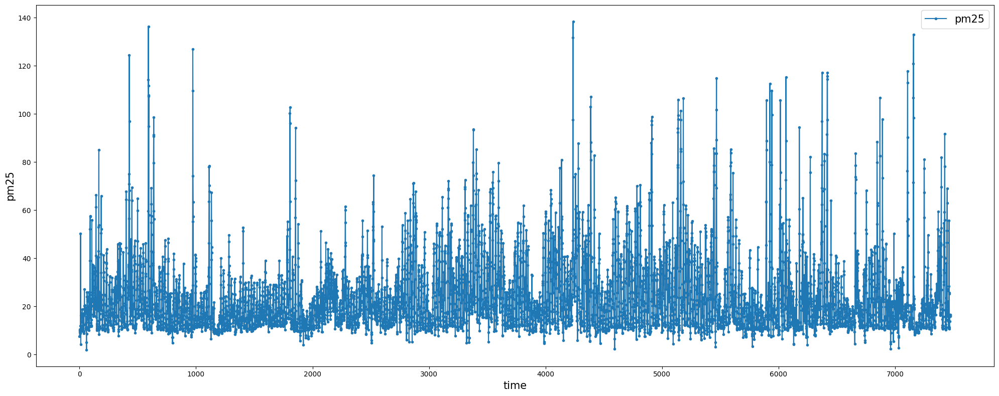

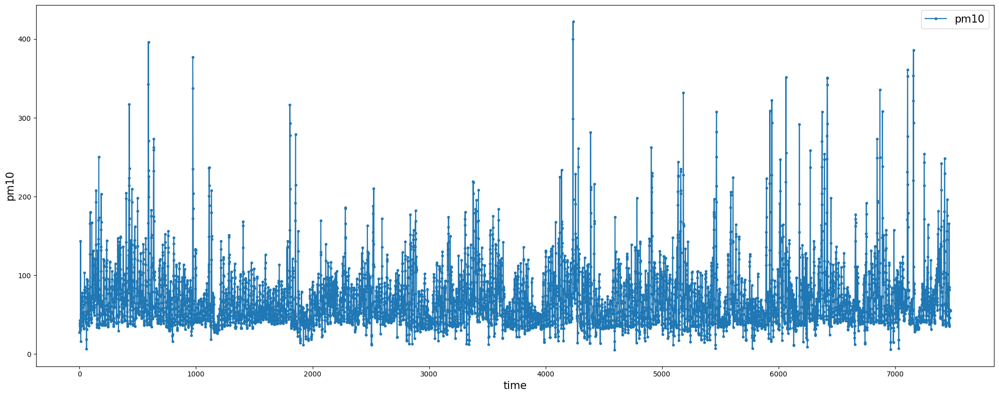

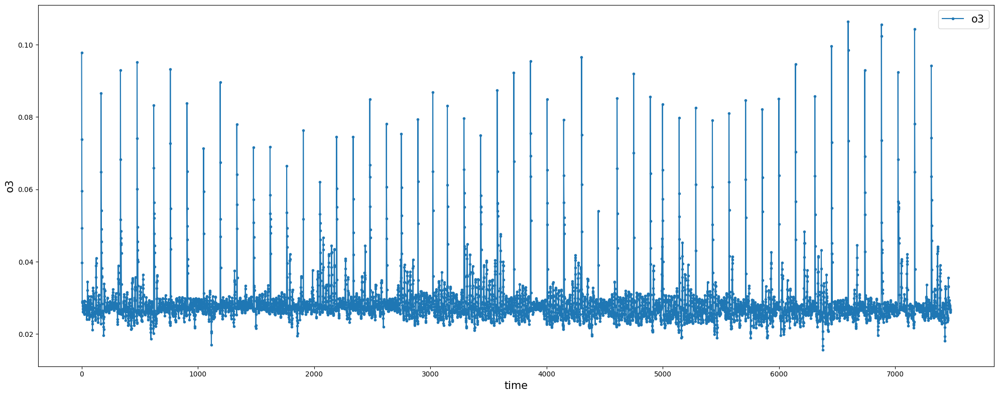

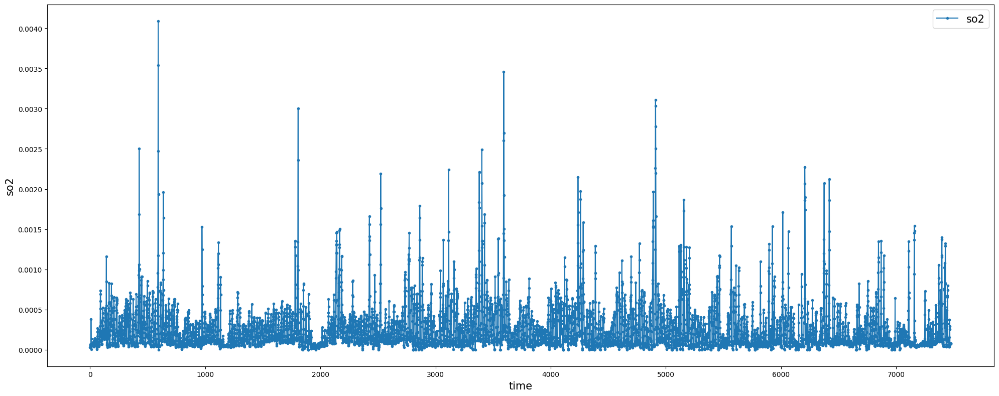

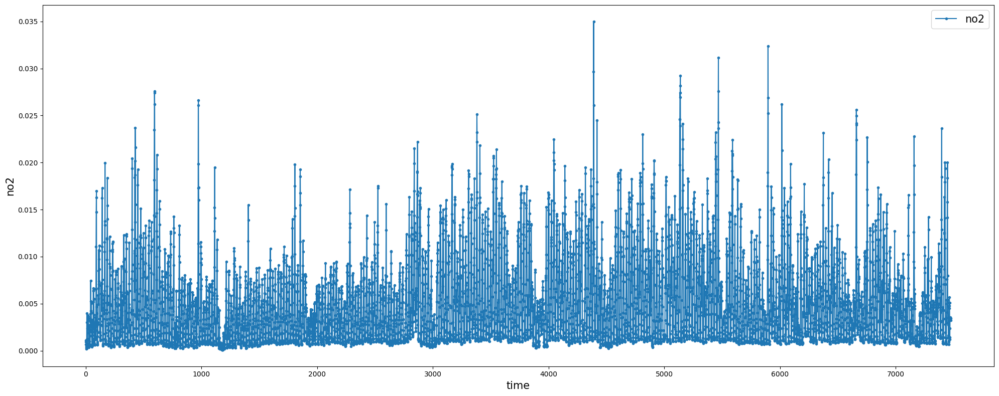



Current station = 215, number of records = 7476



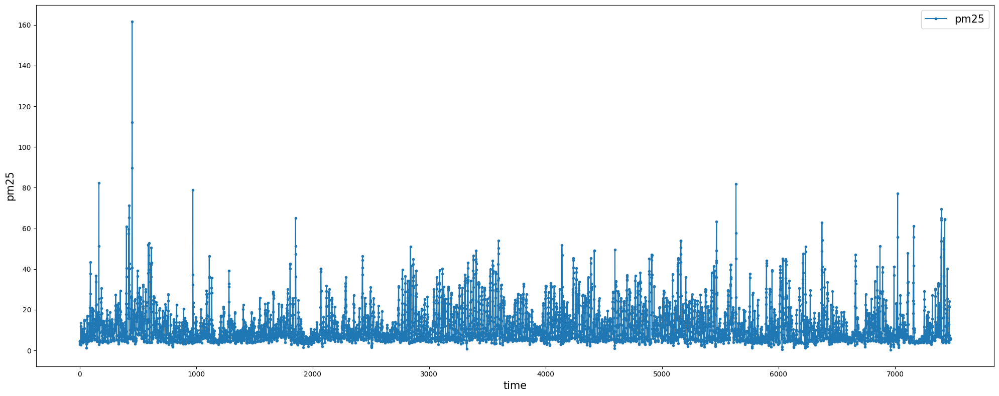

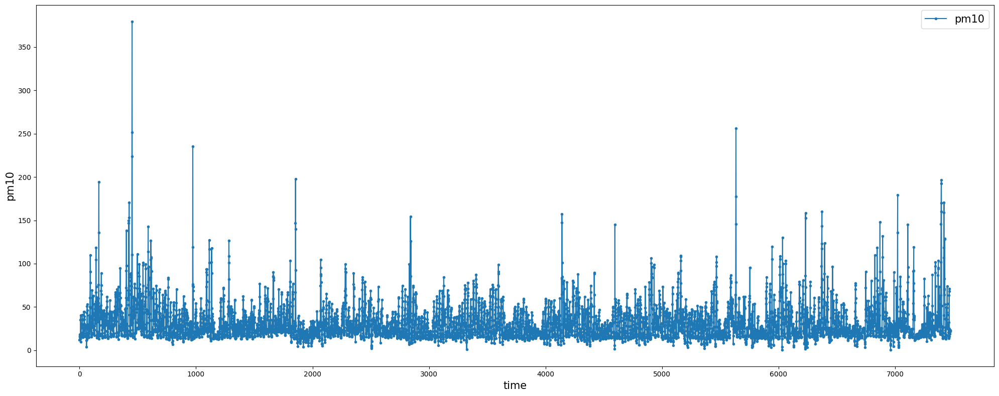

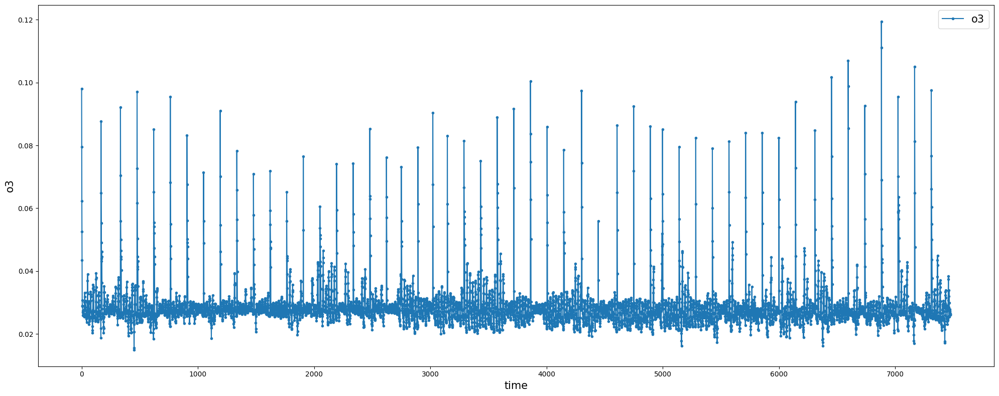

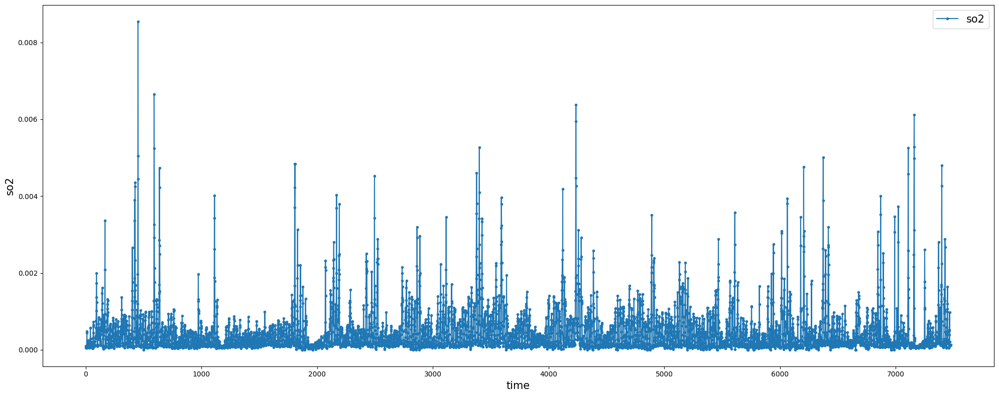

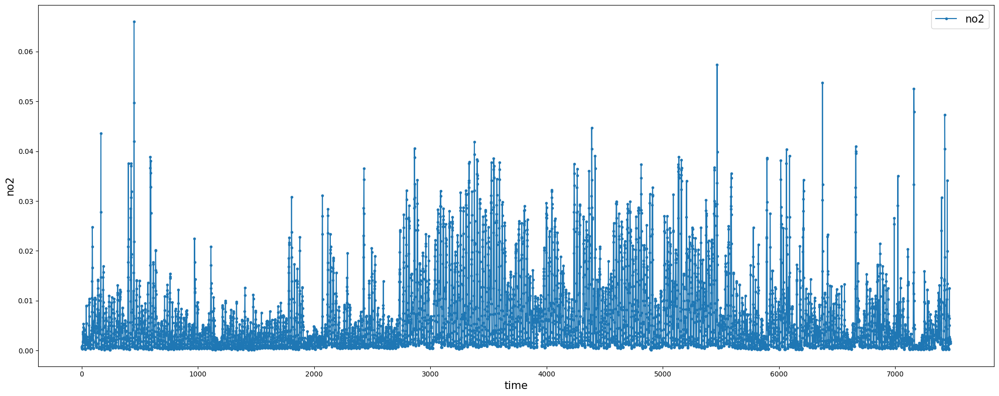



Current station = 216, number of records = 7476



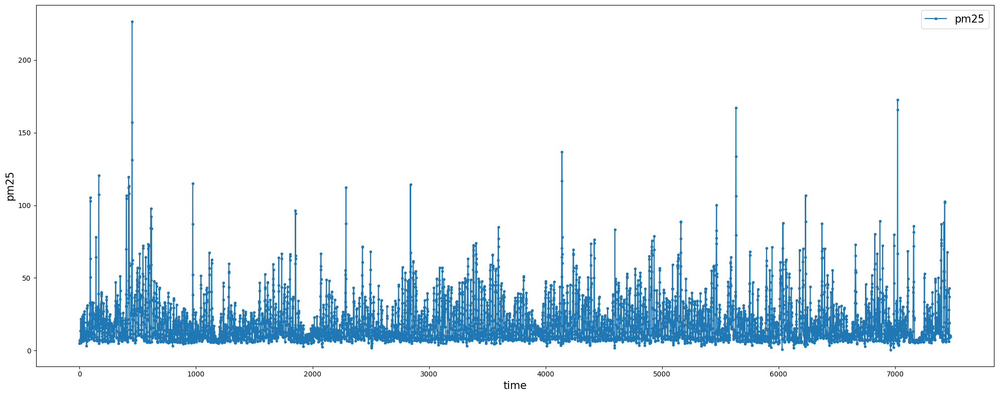

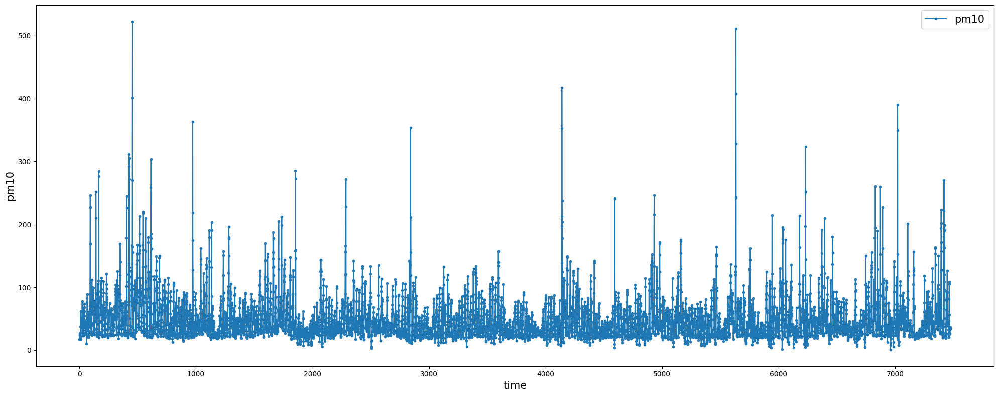

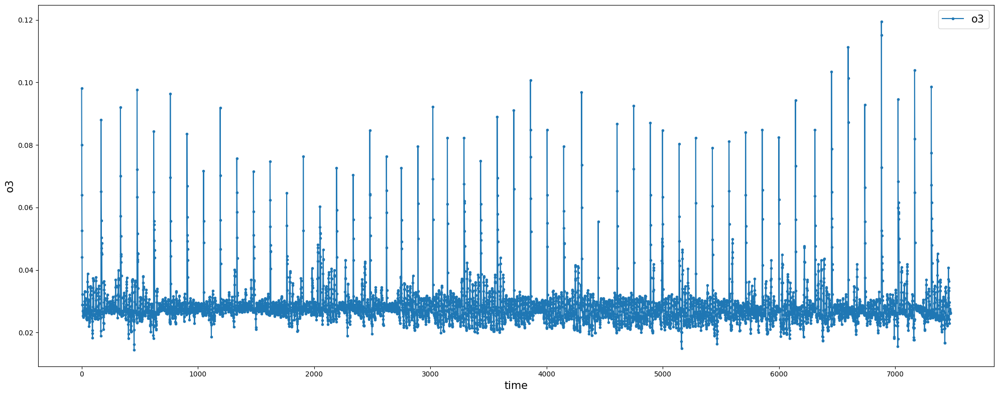

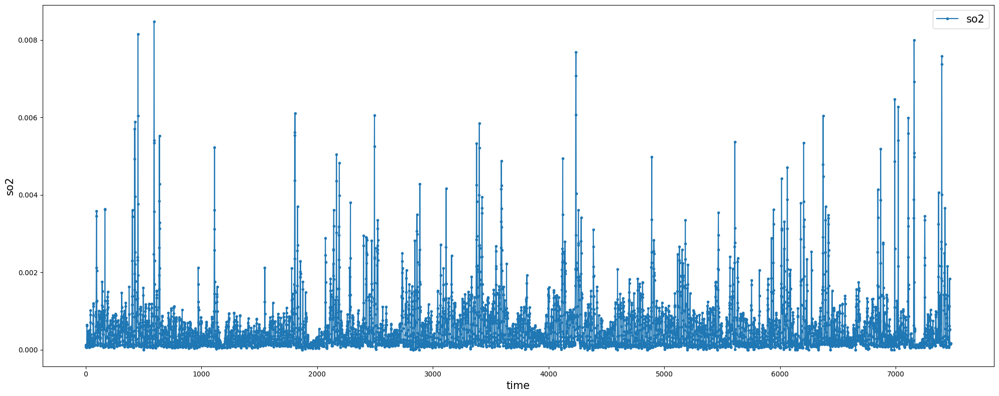

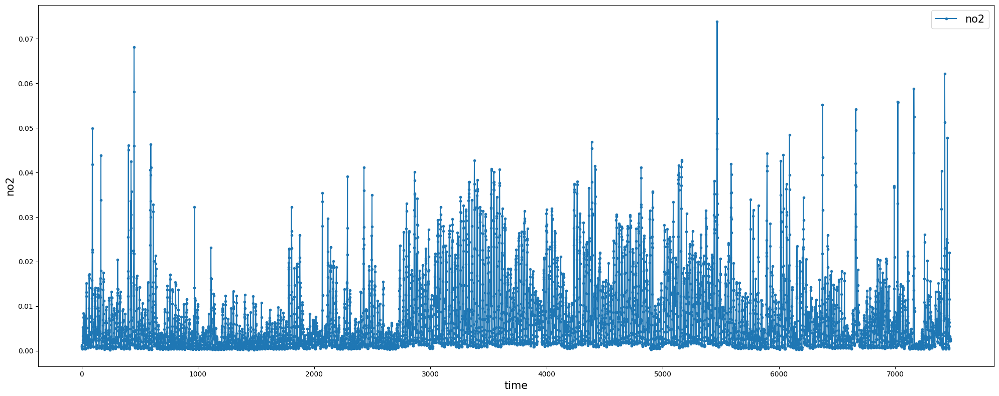

In [95]:
stations = sorted(df_cmaq_raw["station"].unique())
for station in stations:
    df_current_station = df_cmaq_raw[df_cmaq_raw["station"] == station]
    print(f"Current station = {station}, number of records = {len(df_current_station)}\n")
    for f in df_current_station.columns.drop("station"):
        plot_1_data(data=df_current_station[f], datalabel=f, xlabel="time", ylabel=f)
    print("\n" + "=" * 100 + "\n")

## Visualization

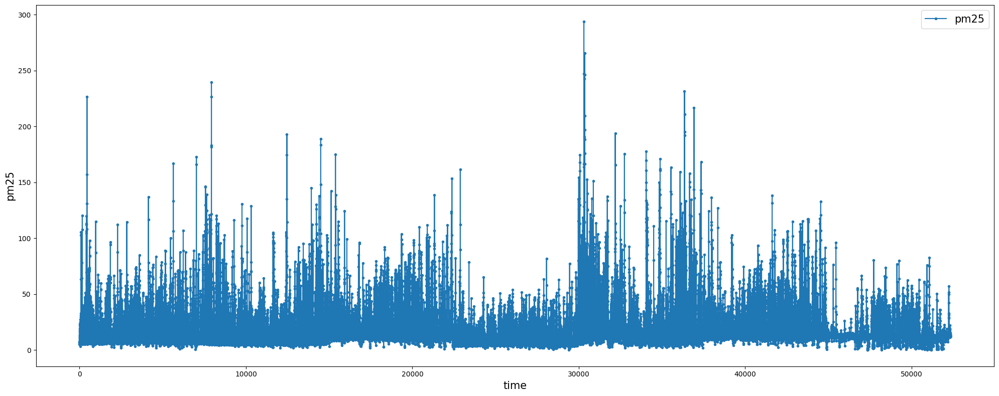

In [96]:
plot_1_data(data=df_cmaq_raw["pm25"], datalabel="pm25", xlabel="time", ylabel="pm25")

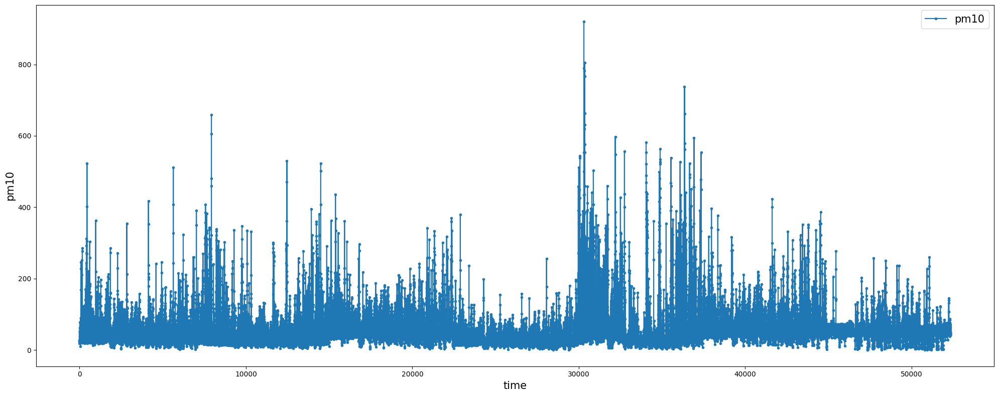

In [97]:
plot_1_data(data=df_cmaq_raw["pm10"], datalabel="pm10", xlabel="time", ylabel="pm10")

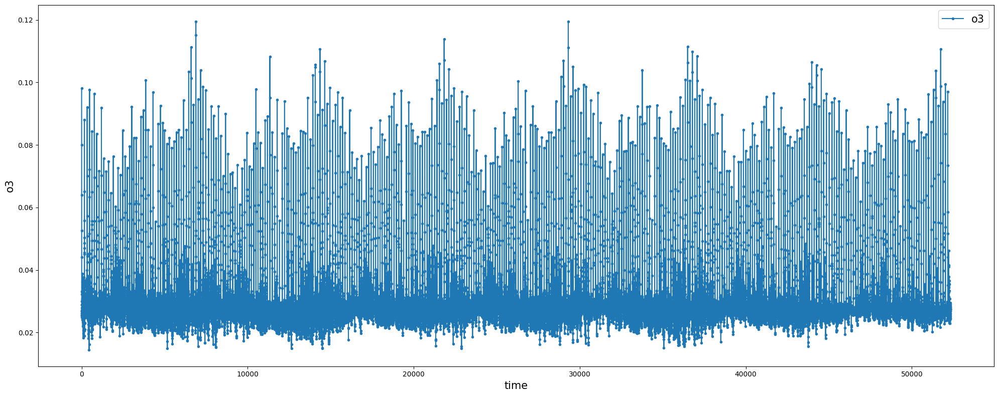

In [98]:
plot_1_data(data=df_cmaq_raw["o3"], datalabel="o3", xlabel="time", ylabel="o3")

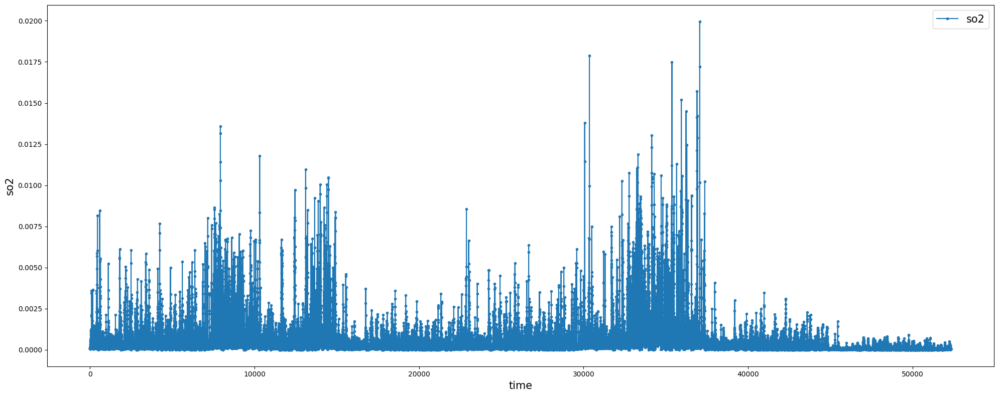

In [99]:
plot_1_data(data=df_cmaq_raw["so2"], datalabel="so2", xlabel="time", ylabel="so2")

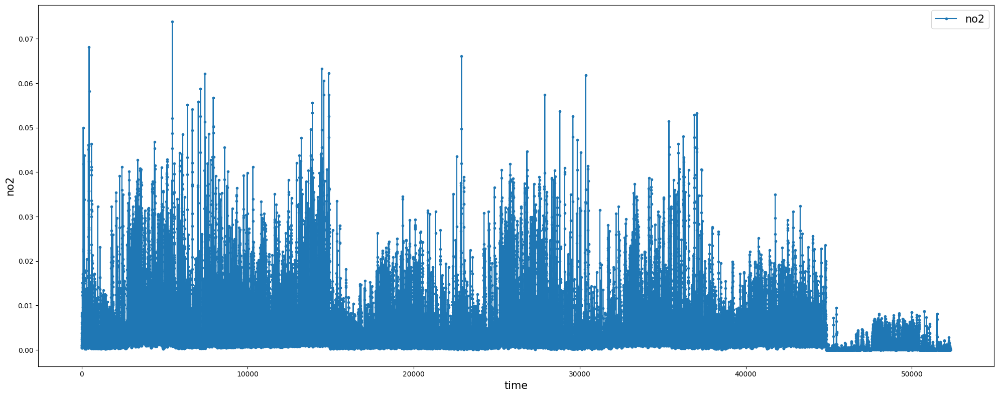

In [100]:
plot_1_data(data=df_cmaq_raw["no2"], datalabel="no2", xlabel="time", ylabel="no2")